In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import cv2
import os
import math
import pandas as pd

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn import preprocessing
from sklearn.model_selection import train_test_split

from tensorflow.keras import backend #Keras version 2.1.6
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Concatenate

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing import image

from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(33)

os.environ["CUDA_VISIBLE_DEVICES"] = '0'
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession



config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.9
sess = tf.Session(config = config)

2023-07-09 15:54:24.181700: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Instructions for updating:
non-resource variables are not supported in the long term


2023-07-09 15:54:25.760298: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-09 15:54:25.761675: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2023-07-09 15:54:25.825232: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: NVIDIA GeForce RTX 3090 computeCapability: 8.6
coreClock: 1.74GHz coreCount: 82 deviceMemorySize: 23.70GiB deviceMemoryBandwidth: 871.81GiB/s
2023-07-09 15:54:25.825296: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2023-07-09 15:54:25.831220: I tensorflow/stream_executor/platform/default/

In [2]:
# df_a = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Combined_Dataset/IND_and_Nep_AQI_Dataset.csv')

df_a = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/India/Bengaluru/Bengaluru_AQI_All_info.csv')
df_a2 = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/India/Delhi/Delhi_AQI_All_Info.csv')
df_a3 = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/India/Dimapur/Dimapur_AQI_All_Info.csv')
df_a4 = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/India/Faridabad/Faridabad_AQI_All_Info.csv')
df_a5 = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/India/Mumbai/Mumbai_AQI_All.csv')
df_a6 = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/India/Tamil_Nadu/Oragadam_AQI_All_Info.csv')


# df = pd.read_csv('/mnt/harry/air_quality/Datasets/AirPollutionImageDataset/AirPollutionImageDataset/Country_wise_Dataset/Nepal/Biratnagar/Biratnagar_AQI_All_info.csv')

df = pd.read_csv('/mnt/harry/air_quality/Datasets/renwu/仁武_24h.csv')
df2 = pd.read_csv('/mnt/harry/air_quality/Datasets/linyuan/林園_24h.csv')
df3 = pd.read_csv('/mnt/harry/air_quality/Datasets/xitun/西屯_24h.csv')
df4 = pd.read_csv('/mnt/harry/air_quality/Datasets/taixi/台西_24h.csv')
df5 = pd.read_csv('/mnt/harry/air_quality/Datasets/douliu/斗六_24h.csv')
# df6 = pd.read_csv('/mnt/harry/air_quality/Datasets/high/antalya/antalya.csv')
# df7 = pd.read_csv('/mnt/harry/air_quality/Datasets/high/roo/roo.csv')
# df8 = pd.read_csv('/mnt/harry/air_quality/Datasets/high/Magaland/magaland.csv')

# df5 = pd.read_csv('/mnt/harry/air_quality/Datasets/taoyuan/桃園_24h_new.csv')
# df2 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_renwu.csv')
# df3 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_linyuan.csv')
# df4 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_xitun.csv')
# df5 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_taixi.csv')
# df6 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_douliu.csv')

# df = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_renwu_night.csv')
# df2 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_linyuan_night.csv')
# df3 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_xitun_night.csv')
# df4 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_taixi_night.csv')
# df5 = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_douliu_night.csv')


In [3]:
# import pandas as pd

# # 假设您的DataFrame名为df
# df6.rename(columns={'pm2.5concentration': 'pm2.5_concentration'}, inplace=True)
# df7.rename(columns={'pm2.5concentration': 'pm2.5_concentration'}, inplace=True)
# df8.rename(columns={'pm2.5concentration': 'pm2.5_concentration'}, inplace=True)



In [4]:
df = pd.concat([ df, df2, df3, df4, df5])

In [5]:
df_a = pd.concat([ df_a2, df_a3, df_a4, df_a5, df_a])

In [6]:
pd.set_option('display.max_rows', None)
df

,filename,pm2.5_concentration
0,49_201907010000,4
1,49_201907010100,6
2,49_201907010200,3
3,49_201907010300,1
4,49_201907010400,4
5,49_201907010500,5
6,49_201907010600,5
7,49_201907010700,6
8,49_201907010800,12
9,49_201907010900,9


In [7]:
df_a = df_a.drop('Year', axis=1)
df_a = df_a.drop('Month', axis=1)
df_a = df_a.drop('Day', axis=1)
df_a = df_a.drop('Hour', axis=1)
df_a = df_a.drop('AQI', axis=1)
df_a = df_a.drop('PM10', axis=1)
df_a = df_a.drop('O3', axis=1)
df_a = df_a.drop('CO', axis=1)
df_a = df_a.drop('SO2', axis=1)
df_a = df_a.drop('NO2', axis=1)
df_a = df_a.drop('Location', axis=1)
df_a = df_a.drop('AQI_Class', axis=1)
df_a = df_a.rename(columns={'Filename': 'filename'})
df_a = df_a.rename(columns={'PM2.5': 'pm2.5_concentration'})

In [8]:
df_a

,filename,pm2.5_concentration
0,DEL_VUnH_2023-02-04-17.00-1.jpg,174.0
1,DL_VUNH_2023-02-04-17.00-1-1.jpg,174.0
2,DL_VUNH_2023-02-04-17.00-1-10.jpg,174.0
3,DL_VUNH_2023-02-04-17.00-1-11.jpg,174.0
4,DL_VUNH_2023-02-04-17.00-1-12.jpg,174.0
5,DL_VUNH_2023-02-04-17.00-1-13.jpg,174.0
6,DL_VUNH_2023-02-04-17.00-1-14.jpg,174.0
7,DL_VUNH_2023-02-04-17.00-1-15.jpg,174.0
8,DL_VUNH_2023-02-04-17.00-1-16.jpg,174.0
9,DL_VUNH_2023-02-04-17.00-1-17.jpg,174.0


In [9]:
new_df = pd.DataFrame()
for i in range(len(df)):
    try:
        imgtest = image.load_img('/mnt/harry/air_quality/Datasets/all_EPA_24h_reverse/all_EPA_24h/'+df.iloc[i, 0]+'.jpg')
        imgtest = image.img_to_array(imgtest)
        if np.all(imgtest[:,:,0] == imgtest[:,:,1]) and np.all(imgtest[:,:,1] == imgtest[:,:,2]): #if night
#             new_row = df.iloc[i].copy()
#             new_df = pd.concat([new_df, new_row.to_frame().transpose()], ignore_index=True)
            pass
        else:#if day
#             pass
#             print(i)
            new_row = df.iloc[i].copy()
            new_df = pd.concat([new_df, new_row.to_frame().transpose()], ignore_index=True)
    except FileNotFoundError:
        pass

In [10]:
df = new_df

In [11]:
df = pd.concat([ df, df_a])

In [12]:
# 複製整個DataFrame
# new_df_a = df_a.copy()
# new_df_a['filename'] = new_df_a['filename'] + '_r'

# df_a = pd.concat([df_a, new_df_a])


# 複製整個DataFrame

new_df = df.copy()
new_df['filename'] = new_df['filename'] + '_r'

df = pd.concat([df, new_df])

# df = pd.concat([df, df_a])

In [13]:
df

,filename,pm2.5_concentration
0,49_201907020500,7
1,49_201907020600,6
2,49_201907020700,2
3,49_201907020800,1
4,49_201907020900,1
5,49_201907021000,1
6,49_201907021100,3
7,49_201907021300,1
8,49_201907021400,1
9,49_201907021500,1


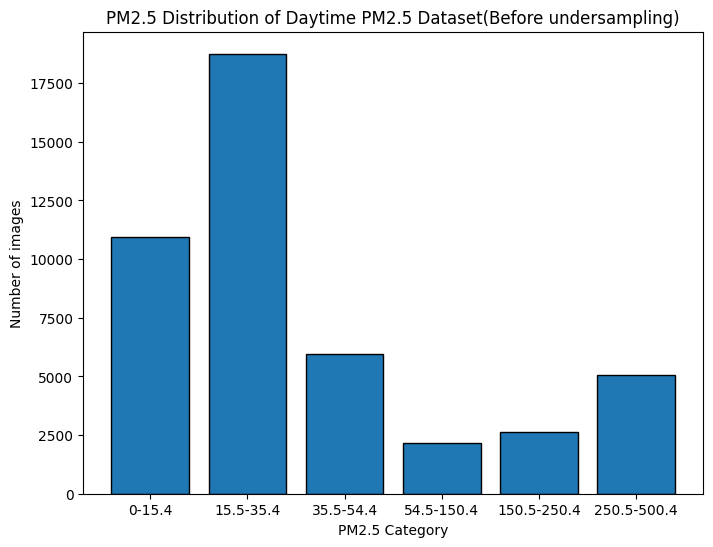

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# 定义PM2.5的分组区间
bins = [0, 15.4, 35.4, 54.4, 150.4, 250.4, 500.4]
labels = ['0-15.4', '15.5-35.4', '35.5-54.4', '54.5-150.4', '150.5-250.4', '250.5-500.4']

# 将数据分组
df['Category'] = pd.cut(df['pm2.5_concentration'], bins=bins, labels=labels, right=False)

# 统计每个类别的频数
category_counts = df['Category'].value_counts()

# 创建一个与labels顺序一致的空列表
category_counts_ordered = []

# 遍历labels列表，按顺序获取对应的频数
for label in labels:
    category_counts_ordered.append(category_counts[label])

# 创建图表
plt.figure(figsize=(8, 6))

# 绘制直方图
plt.bar(labels, category_counts_ordered, edgecolor='black')

# 设置图表标题和坐标轴标签
plt.title("PM2.5 Distribution of Daytime PM2.5 Dataset(Before undersampling)")
plt.xlabel("PM2.5 Category")
plt.ylabel("Number of images")

# 显示图表
plt.show()

0-15.4         2156
15.5-35.4      2156
35.5-54.4      2156
54.5-150.4     2156
150.5-250.4    2156
250.5-500.4    2156
Name: Category, dtype: int64


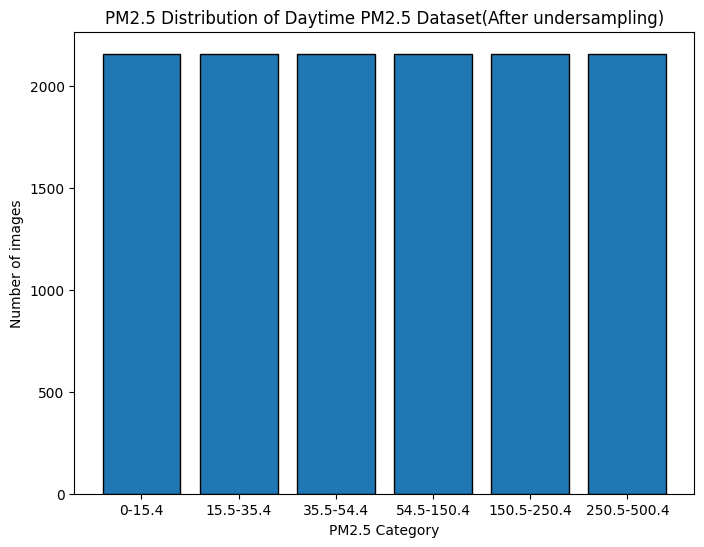

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# 定义PM2.5的分组区间
bins = [0, 15.4, 35.4, 54.4, 150.4, 250.4, 500.4]
labels = ['0-15.4', '15.5-35.4', '35.5-54.4', '54.5-150.4', '150.5-250.4', '250.5-500.4']

# 将数据分组
df['Category'] = pd.cut(df['pm2.5_concentration'], bins=bins, labels=labels, right=False)

# 统计每个类别的频数
category_counts = df['Category'].value_counts().sort_values()

# 找到最少且不为0的类别
smallest_nonzero_category = category_counts[category_counts > 0].index[0]

# 根据最少且不为0的类别进行欠采样
df_balanced = df.groupby('Category').apply(lambda x: x.sample(n=min(len(x), category_counts[smallest_nonzero_category])))

# 统计每个类别的频数
category_counts_balanced = df_balanced['Category'].value_counts().sort_index()
print(category_counts_balanced)
plt.figure(figsize=(8, 6))
# 绘制直方图
plt.bar(category_counts_balanced.index, category_counts_balanced.values, edgecolor='black')

# 设置图表标题和坐标轴标签
plt.title("PM2.5 Distribution of Daytime PM2.5 Dataset(After undersampling)")
plt.xlabel("PM2.5 Category")
plt.ylabel("Number of images")

# 显示图表
plt.show()

In [17]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # 定义PM2.5的分组区间
# bins = [0,11,23,35,41,47,53,58,64,70,200]
# labels = ['0-11', '12-23', '24-35', '36-41', '42-47', '48-53', '54-58', '59-64', '65-70','71-200']

# # 将数据分组
# df['Category'] = pd.cut(df['pm2.5_concentration'], bins=bins, labels=labels, right=False)

# # 统计每个类别的频数
# category_counts = df['Category'].value_counts().sort_index()

# # 绘制直方图
# plt.bar(category_counts.index, category_counts.values, edgecolor='black')

# # 设置图表标题和坐标轴标签
# plt.title("PM2.5 Distribution")
# plt.xlabel("PM2.5 Category")
# plt.ylabel("Frequency")

# # 显示图表
# plt.show()

In [16]:
df = df_balanced

In [17]:
# 打乱DataFrame的顺序
df_shuffled = df.sample(frac=1, random_state=42)

# 重置索引
df_shuffled = df_shuffled.reset_index(drop=True)

df = df_shuffled

In [18]:
df = df.drop("Category", axis=1)

In [20]:
len(df)

12936

In [21]:
# df.to_csv('Day_balance.csv', index=False)

In [23]:
# df_balanced.to_csv('Balance_EPA_Dataset_agumentation_renwu_night.csv', index=False)

In [24]:
# df = pd.read_csv('/mnt/harry/air_quality/Program/backup/Balance_EPA_Dataset_agumentation_xitun.csv')

In [25]:
len(df)

648